<a href="https://colab.research.google.com/github/gekoramy/uni.deep-learning/blob/yolo/yolo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# YOLOv5 🚀
This example loads a pretrained YOLOv5s model and passes an image for inference. YOLOv5 accepts URL, Filename, PIL, OpenCV, Numpy and PyTorch inputs, and returns detections in torch, pandas, and JSON output formats.

More detailed information are available [here](https://docs.ultralytics.com/yolov5/tutorials/pytorch_hub_model_loading/)

## Initial setup

Configure device settings

In this file we load YOLOv5 from PyTorch Hub. As a consequence we need to import the toch module.

In [1]:
import torch

In [2]:
if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device('cpu')
print("Using {}.".format(device))

Using cuda.


**FIX the output**


```
# requirements: /root/.cache/torch/hub/requirements.txt not found, check failed.
```

This warning does not affect the subsequent execution. Hence, it is not mandatory to include the following instructions. However, it is annoying to see a red word in the output of a command. With this caveat we:

1.   Clone yolov5 repository
2.   Install the requirements in requirements.txt
3.   Copy the requirements.txt in `/root/.cache/torch/hub/` which is apparently the location where yolo checks the installed requirements.





Get YOLO requirements.

In [3]:
!git clone https://github.com/ultralytics/yolov5  # clone
!pip install -r yolov5/requirements.txt  # install
!mkdir -p /root/.cache/torch/hub/  #create the folder
!cp yolov5/requirements.txt /root/.cache/torch/hub/ #copy in the proper location

Cloning into 'yolov5'...
remote: Enumerating objects: 15577, done.
remote: Counting objects: 100% (184/184), done.
remote: Compressing objects: 100% (131/131), done.
remote: Total 15577 (delta 79), reused 106 (delta 53), pack-reused 15393
Receiving objects: 100% (15577/15577), 14.64 MiB | 6.94 MiB/s, done.
Resolving deltas: 100% (10603/10603), done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 1.5 MB/s eta 0:00:00


Import the yolo model.

In [4]:
model = torch.hub.load('ultralytics/yolov5', 'yolov5s')

/usr/local/lib/python3.9/dist-packages/torch/hub.py:286: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 2023-4-22 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

100%|██████████| 14.1M/14.1M [00:00<00:00, 31.1MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 


Load the dataset from a google drive folder. This is probably the solution which we are going to use in our project. I have uploaded a random dataset on google drive in a tar.gz folder. With the following piece of code I download the folder and unzip it.

In [5]:
!mkdir dataset
!gdown 1Lmi0DcnPqxuRbbVl-o8OabzzxcKgy47T
!mv myDataset.tar ./dataset/
!ls dataset
!tar -xf dataset/myDataset.tar -C dataset
!ls dataset

Downloading...
From: https://drive.google.com/uc?id=1Lmi0DcnPqxuRbbVl-o8OabzzxcKgy47T
To: /content/myDataset.tar
100% 1.30M/1.30M [00:00<00:00, 156MB/s]
myDataset.tar
1.jpg  2.jpg  3.jpeg  3.jpg  4.jpg  5.jpg  myDataset.tar


## OpenCV
We start by considering OpenCV. It is reasonable to start considering this image manipulator module since it is very powerful and well consolidated.

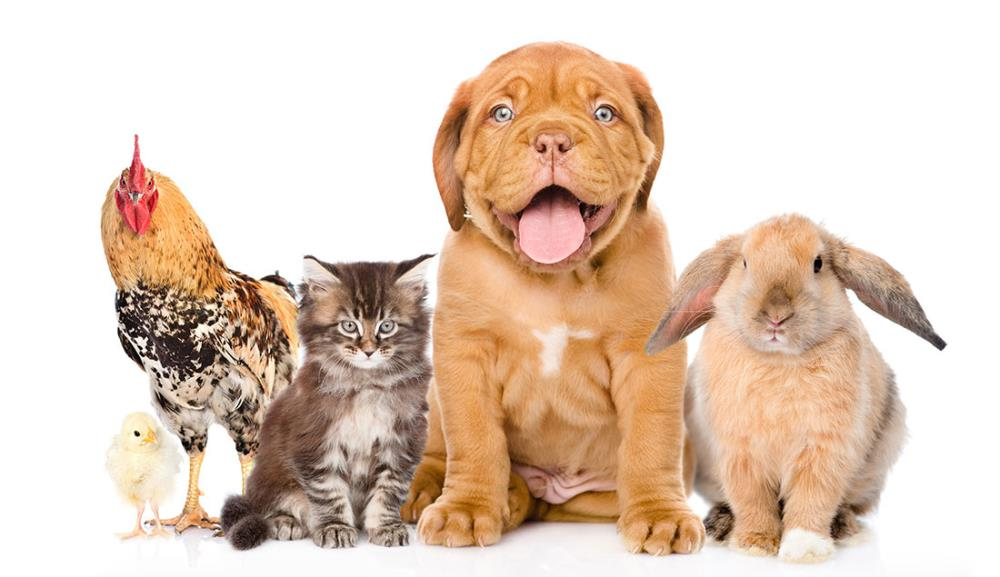

In [6]:
import cv2 as cv
from google.colab.patches import cv2_imshow #this module is required otherwise cv2.imshow() is disabled in Colab, because it causes Jupyter sessions to crash
import numpy as np
import matplotlib.pyplot as plt

cv_image = cv.imread("/content/dataset/3.jpg")
cv2_imshow(cv_image);

### YOLO inference and result presentation
Execute YOLO on the provided dataset and present the results in a convenient way.


**Remark:** OpenCV uses BGR as its default colour order for images, matplotlib uses RGB. When you display an image loaded with OpenCv in matplotlib the channels will be back to front. We use ```cv.cvtColor(cv_image, cv.COLOR_BGR2RGB)``` to solve the problem.



First of all we execute the yolo model with all the target images of our dataset.

In [7]:
dataset_root = "/content/dataset/"
dataset_size = 5

#load the image dataset in a list
img_dataset_list = list()
for img_index in range(1,dataset_size+1):
  cv_image = cv.imread(dataset_root+str(img_index)+".jpg")
  cv_image = cv.cvtColor(cv_image, cv.COLOR_BGR2RGB)  #the plot on matplotlib uses RGB colors model,
                                                      #on the other hand opencv uses BGR as default
                                                      #color model
  img_dataset_list.append(cv_image)

#yolo inference
results = model(img_dataset_list)
r_img = results.render()  #returns a list with the images with the bounding box
                          #predictions as np.array

Text(0.5, 1.0, 'prediction')

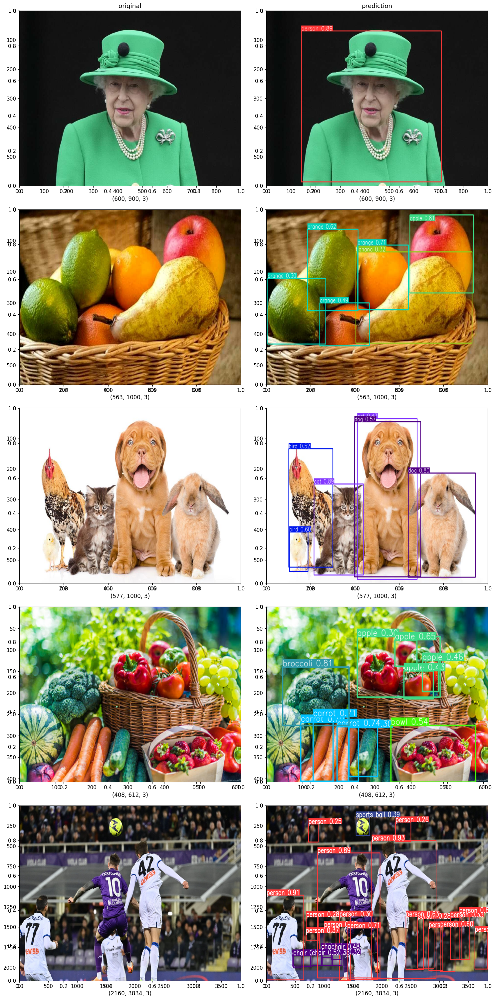

In [8]:
#this line is required in order to plot on google colab using matplotlib
%matplotlib inline

rows = dataset_size
columns = 2

fig, axs = plt.subplots(nrows=rows, ncols=columns, figsize=(15, 30))

plot_index = 1  #coordinate of the next subplot
for num in range(dataset_size):

    #plot original
    fig.add_subplot(rows, columns, plot_index)

    #cv_image = img_dataset_list[num] can't be used
    #executing results.render() the bounding boxes are added to the images.
    #So, we have to read the images again if we want to plot the original
    #figures.
    img_index = num+1
    cv_image = cv.imread(dataset_root+str(img_index)+".jpg")
    cv_image = cv.cvtColor(cv_image, cv.COLOR_BGR2RGB)  #the plot on matplotlib uses RGB colors model,
                                                        #on the other hand opencv uses BGR as default
                                                        #color model

    plt.imshow(cv_image, aspect='auto')
    plt.xlabel(f'{cv_image.shape}', fontsize=12)

    plot_index+=1
    ###

    #plot yolo output
    fig.add_subplot(rows, columns, plot_index)
    
    img_with_boxes = r_img[num] #image with boxes as np.array

    plt.imshow(img_with_boxes, aspect='auto')
    plt.xlabel(f'{img_with_boxes.shape}', fontsize=12)

    plot_index+=1
    ###

fig.tight_layout() # used to adjust padding between subplots 

axs[0][0].set_title("original")
axs[0][1].set_title("prediction")

### Crop the bounding box area
Another useful operation for our aims is to crop the areas of the images inside the bounding boxes.

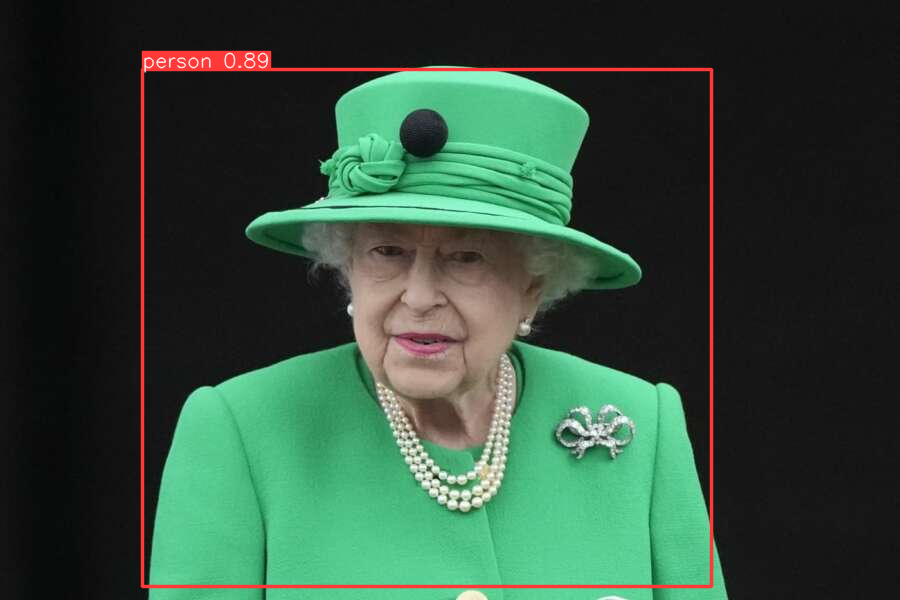

In [9]:
img_pred = r_img[0]
img_pred = cv.cvtColor(img_pred, cv.COLOR_BGR2RGB)
cv2_imshow(img_pred)

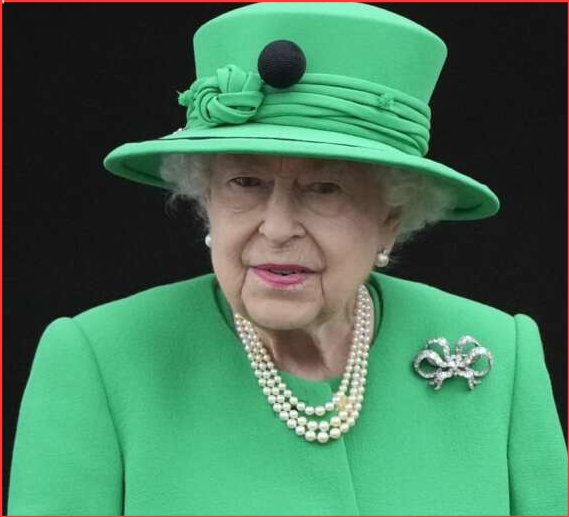

In [10]:
#results.xyxy[0]  predictions on the first input image
#tensor([[xmin,  ymin, xmax, ymax,   confidence,   class]])
#tensor([[142.07394,  69.79317, 711.07904, 586.92273,   0.89177,   0.00000]])

#upper left corner x coordinate of the first bounding box which has been found
left_x = int(results.xyxy[0][0][0].item())  #.item() returns the value of this
                                            #tensor as a standard Python number. 
                                            #This only works for tensors with 
                                            #one element.
left_y = int(results.xyxy[0][0][1].item())
right_x = int(results.xyxy[0][0][2].item())
right_y = int(results.xyxy[0][0][3].item())

#cropping
#crop_img = img[y:y+h, x:x+w]
crop_img = img_pred[left_y:right_y, left_x:right_x]

cv2_imshow(crop_img)

## PIL
A powerful alternative of OpenCV is PIL. The Python Imaging Library adds image processing capacities to your Python code. This library gives broad file format support, an effective internal representation, and fairly strong image-processing capacities. The core library is intended to access information stored in a few pixel formats quickly. It ought to give a strong groundwork to general image processing tools. Pillow supports a range of image file formats.
Refernce: [Image processing in Python using Pillow](https://www.topcoder.com/thrive/articles/image-processing-in-python-using-pillow)



We can use the open() method in the image module to load an image from a file, passing it the path to the image.

In [11]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

image = Image.open("/content/dataset/1.jpg")

After getting an image object, you can use the methods and attributes defined by the class to process and manipulate it.

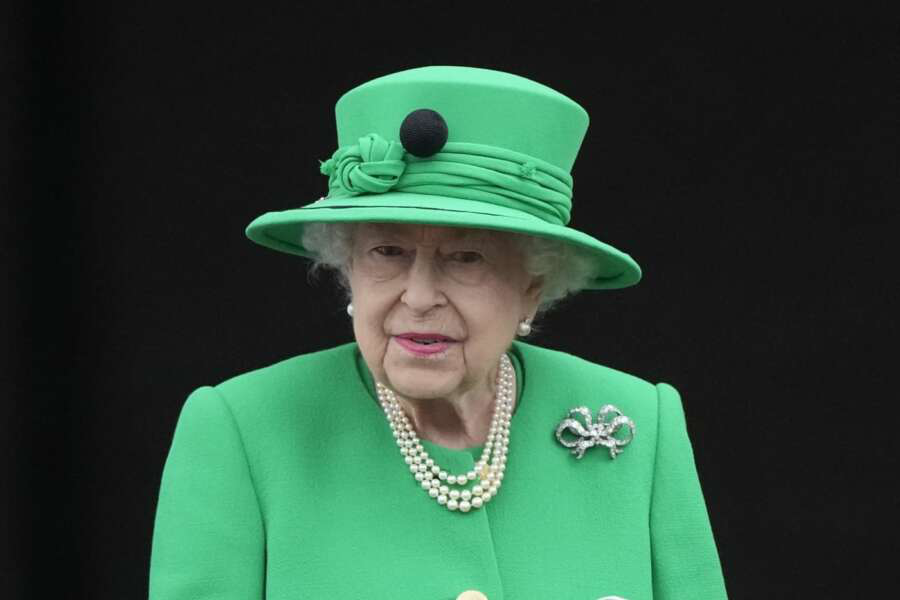

JPEG
RGB
(900, 600)


In [12]:
# To display the image
image.show()

# The file format of the image file.
print(image.format) # Output: JPEG

# The pixel format used by the image file.Typical values can be "1", "L", "RGB", or "CMYK."
print(image.mode) # Output: RGB

# Prints image size, in pixels.The size is given as a tuple(width, height)
print(image.size)

###Resizing images
To resize an image, we can use the resize() method on it and pass a two-integer tuple argument consisting of the width and height of the resized image. The method doesn’t modify the used image; rather, it returns another image with the new dimensions.

(900, 600)
(400, 400)


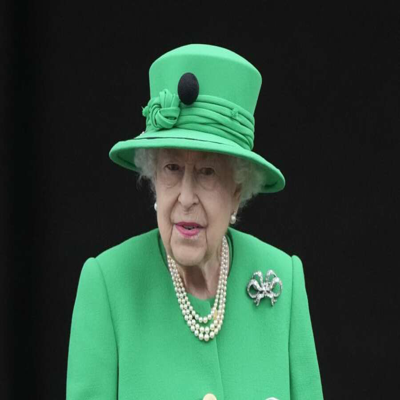

In [13]:
image = Image.open('/content/dataset/1.jpg')
new_image = image.resize((400, 400))

print(image.size)
print(new_image.size)
new_image.show()

If we want to resize images and keep their aspect ratios, then we can use the thumbnail() function to resize them. This also takes a two-integer tuple argument representing the maximum width and height of the thumbnail.

(400, 267)


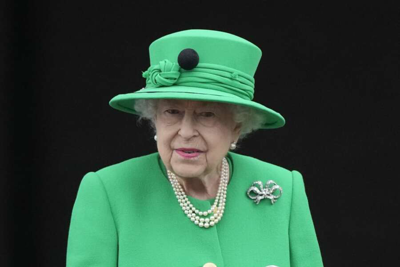

In [14]:
image.thumbnail((400, 400))
print(image.size)
image.show()

### Cropping
With the Pillow library, you can crop a picture with the crop() method of the image class. The method takes a box tuple that characterizes the position and size of the cropped area and returns an image object addressing the cropped picture. The coordinates for the box are (left, upper, right, lower). The cropped segment incorporates the left column and the upper row of pixels and goes up to (however, does exclude) the right column and base row of pixels.

(900, 600)
(569, 517)


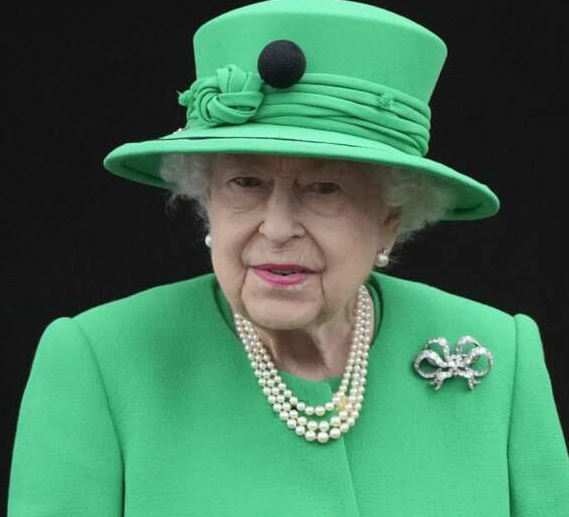

In [15]:
image = Image.open('/content/dataset/1.jpg')

#box[0] <-- x of the top left corner
#box[1] <-- y of the top left corner
#box[2] <-- x of the bottom right corner
#box[3] <-- y of the bottom right corner
box = (left_x, left_y, right_x, right_y)
cropped_image = image.crop(box)
#cropped_image.save('cropped_image.jpg')

# Print size of cropped image
print(image.size)
print(cropped_image.size)
cropped_image.show()

Using the rotate() function, we can rotate our images. This takes an integer or float argument representing the degrees to rotate an image and returns a new image object of the rotated image. The rotation is done counterclockwise.

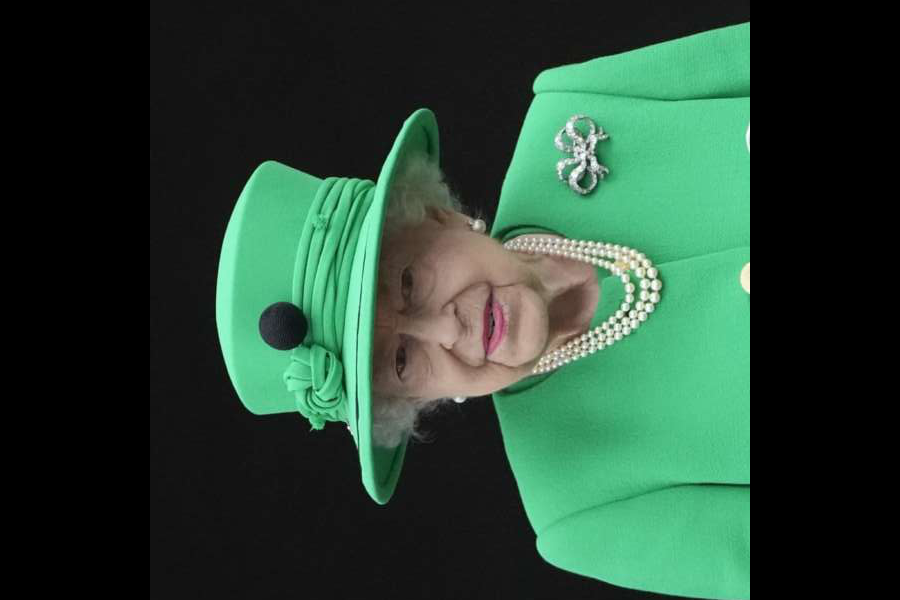

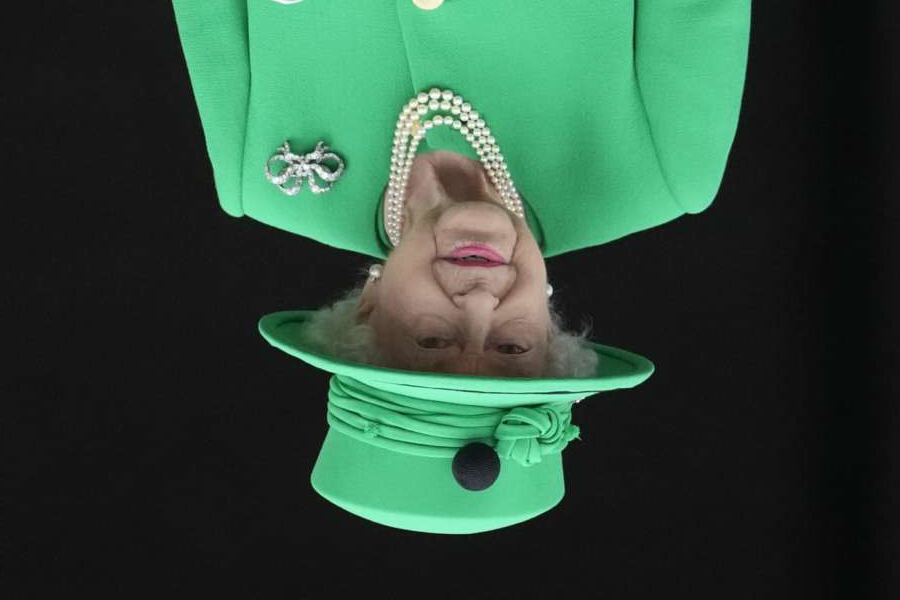

In [16]:
image_rot_90 = image.rotate(90)
image_rot_90.show()

image_rot_180 = image.rotate(180)
image_rot_180.show()

## Link input
YOLOv5 can work also with image links.

In [17]:
import torch
from PIL import Image
import requests
from io import BytesIO
import cv2 as cv
from google.colab.patches import cv2_imshow #this module is required otherwise cv2.imshow() is disabled in Colab, because it causes Jupyter sessions to crash
import numpy as np

# Model
model = torch.hub.load('ultralytics/yolov5', 'yolov5s')

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2023-4-22 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 


The following is the link of an image resource on the web.

In [18]:
# Image
im = 'https://ultralytics.com/images/zidane.jpg'

In order to show an image from the resource link we write the following:

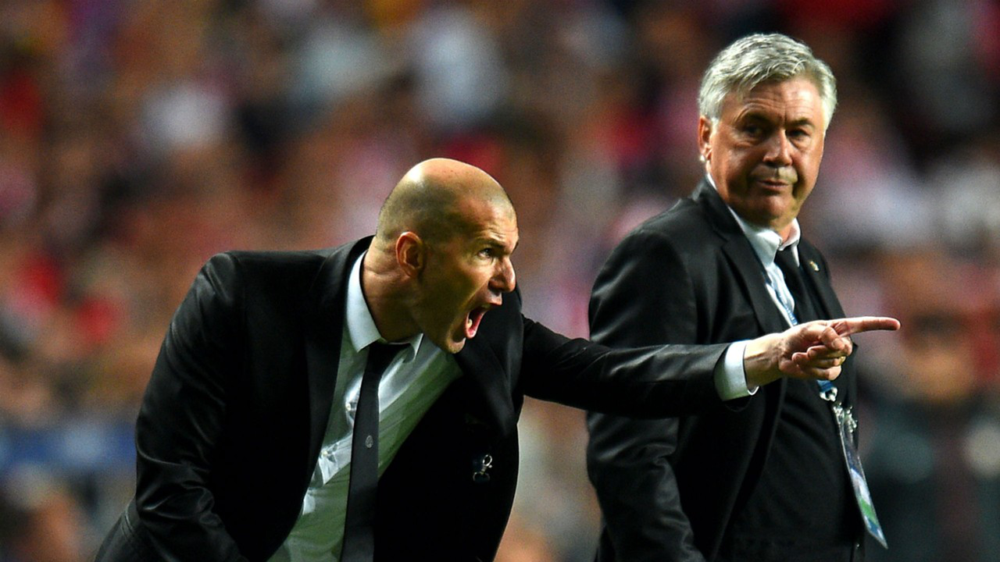

In [19]:
response = requests.get(im)
img = Image.open(BytesIO(response.content))
img.show()

The YOLO inference can be performed directly given the image link as argument.

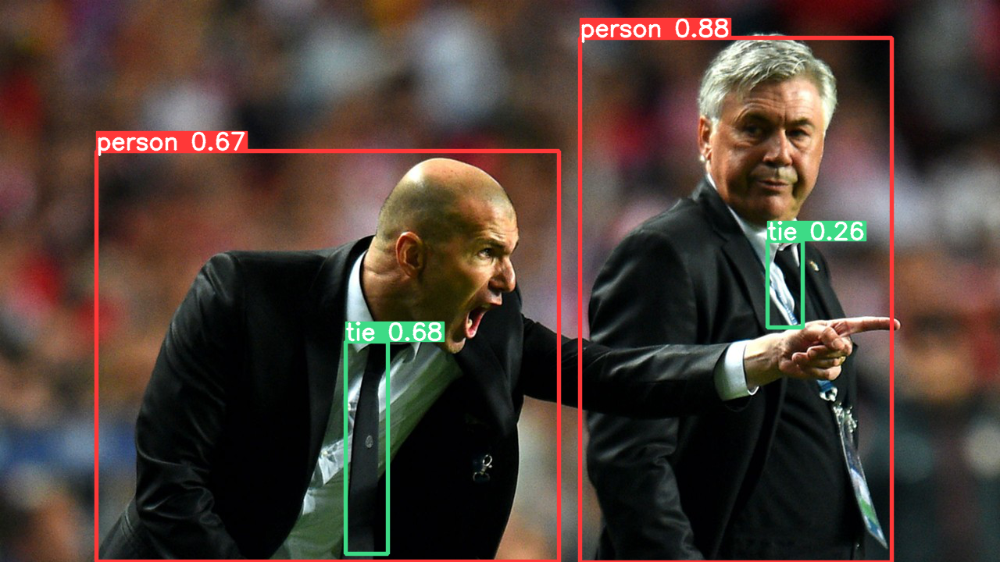

In [20]:
# Inference
results = model(im)

results.show()

The output can also be written in pandas.

In [21]:
results.pandas().xyxy[0]
#      xmin    ymin    xmax   ymax  confidence  class    name
# 0  749.50   43.50  1148.0  704.5    0.874023      0  person
# 1  433.50  433.50   517.5  714.5    0.687988     27     tie
# 2  114.75  195.75  1095.0  708.0    0.624512      0  person
# 3  986.00  304.00  1028.0  420.0    0.286865     27     tie

,xmin,ymin,xmax,ymax,confidence,class,name
0,742.974854,48.395569,1141.844482,720.000000,0.881052,0,person
1,442.007660,437.522400,496.653961,709.973572,0.675213,27,tie
2,123.024109,193.287354,715.662170,719.723877,0.665815,0,person
3,982.803162,308.417358,1027.365845,419.987000,0.260076,27,tie


Interestingly, with method `crop` results can be returned (and optionally saved) as detection crops:

In [22]:
#crops = results.crop(save=True)
crops = results.crop() #cropped detections dictionary

Saved 1 image to runs/detect/exp
Saved results to runs/detect/exp



With the following we print for each bounding box:
*   the cropped image
*   the class
*   the label
*   the confidence of the predictiopn
*   the coordinates of the bounding box relevant angles


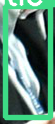

class
tensor(27., device='cuda:0')
label
tie 0.26
confidence
tensor(0.26008, device='cuda:0')
bounding box coordinates
[tensor(982.80316, device='cuda:0'), tensor(308.41736, device='cuda:0'), tensor(1027.36584, device='cuda:0'), tensor(419.98700, device='cuda:0')]




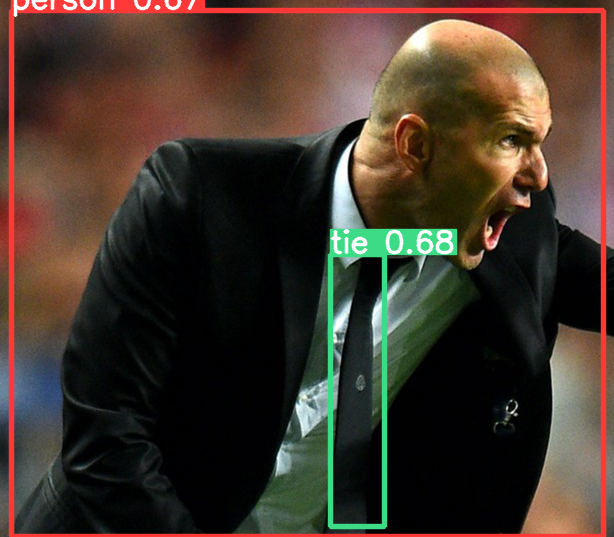

class
tensor(0., device='cuda:0')
label
person 0.67
confidence
tensor(0.66581, device='cuda:0')
bounding box coordinates
[tensor(123.02411, device='cuda:0'), tensor(193.28735, device='cuda:0'), tensor(715.66217, device='cuda:0'), tensor(719.72388, device='cuda:0')]




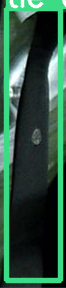

class
tensor(27., device='cuda:0')
label
tie 0.68
confidence
tensor(0.67521, device='cuda:0')
bounding box coordinates
[tensor(442.00766, device='cuda:0'), tensor(437.52240, device='cuda:0'), tensor(496.65396, device='cuda:0'), tensor(709.97357, device='cuda:0')]




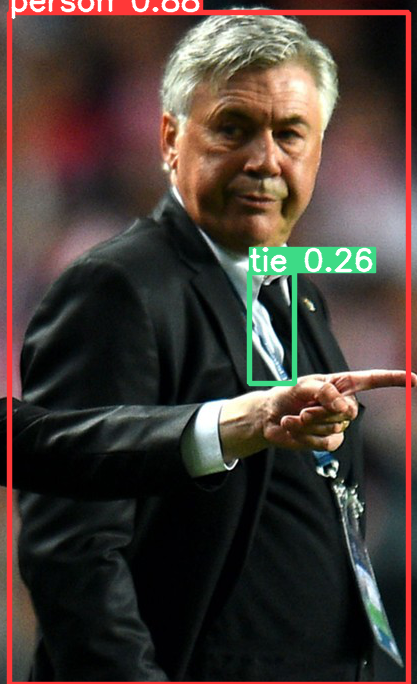

class
tensor(0., device='cuda:0')
label
person 0.88
confidence
tensor(0.88105, device='cuda:0')
bounding box coordinates
[tensor(742.97485, device='cuda:0'), tensor(48.39557, device='cuda:0'), tensor(1141.84448, device='cuda:0'), tensor(720., device='cuda:0')]




In [23]:
for bx in crops:
  #cropped image
  crop_img = bx["im"]
  cv2_imshow(crop_img)

  #class
  print("class")
  crop_class = bx["cls"]
  print(crop_class)

  #label
  print("label")
  crop_label = bx["label"]
  print(crop_label) 

  #confidence
  print("confidence")
  crop_confidence = bx["conf"]
  print(crop_confidence)

  #bounding box coordinates
  print("bounding box coordinates")
  crop_bxcord = bx["box"]
  print(crop_bxcord)

  print("\n")